In [19]:
# Import necessary libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import dash
from dash import dcc, html

In [20]:
# Step 1: Data Loading from Excel .csv File
# Assuming the .csv file contains columns: date, country, cumulative_total_cases, daily_new_cases, 
# active_cases, cumulative_total_deaths, daily_new_deaths
file_path = 'C:\\Users\\rasel\\Desktop\\Data Analyst Portfolio Project\\worldometer_coronavirus_daily_data.csv'  
# Replace with the actual file path
data = pd.read_csv(file_path)

In [21]:
# Step 2: Data Processing and Analysis
# Calculate necessary statistics
total_cases = data['cumulative_total_cases'].max()
total_deaths = data['cumulative_total_deaths'].max()
total_active_cases = data['active_cases'].max()

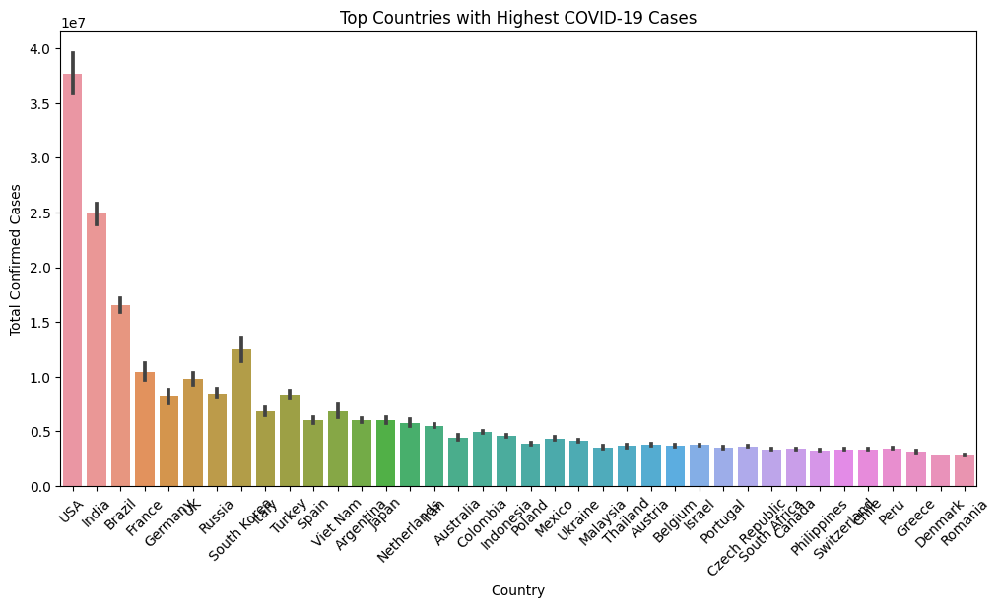

In [25]:
# Step 3: Data Visualization
# Static Visualization using Matplotlib and Seaborn
plt.figure(figsize=(12, 6))
sns.barplot(x='country', y='cumulative_total_cases', data=data.head(10000))
plt.xlabel('Country')
plt.ylabel('Total Confirmed Cases')
plt.title('Top Countries with Highest COVID-19 Cases')
plt.xticks(rotation=45)
plt.show()

In [30]:
# Interactive Visualization using Plotly
fig = px.choropleth(data, locations='country', locationmode='country names',
                    color='cumulative_total_cases', hover_name='country', 
                    color_continuous_scale='Viridis', title='Global COVID-19 Cases')
fig.show()

In [36]:
# Step 4: Dashboard Development using Dash
app = dash.Dash(__name__)

app.layout = html.Div([
    html.H1("COVID-19 Dashboard"),
    html.Div([
        html.Div([
            html.H3("Global Statistics"),
            html.P(f"Total Cases: {total_cases}"),
            html.P(f"Total Deaths: {total_deaths}"),
            html.P(f"Total Active Cases: {total_active_cases}")
        ], style={'width': '30%', 'display': 'inline-block'}),
        html.Div([
            html.H3("Top 10 Countries with Highest Cases"),
            dcc.Graph(
                figure=px.bar(data.head(10000), x='country', y='cumulative_total_cases', 
                              labels={'cumulative_total_cases': 'Total Confirmed Cases'},
                             color_discrete_sequence=['#063970'])
            )
        ], style={'width': '70%', 'display': 'inline-block'})
    ]),
])

if __name__ == '__main__':
    app.run_server(debug=True)